In [24]:
#%matplotlib notebook
import folium
from folium.plugins import FastMarkerCluster

In [25]:
import pandas as pd
import numpy as np
import requests
import sys
import matplotlib.pyplot as plt


# Google API Key
from config import gkey
pd.set_option("display.max_rows", None)

In [26]:
fastfood_us_df = pd.read_csv("fastfood_restaurant_review.csv")

In [27]:
fastfood_us_df.head()

,name,country,latitude,longitude,Street Adress,price_level,rating,user_ratings_total
0,Sonic Drive-In,US,29.814697,-90.814742,"800 N Canal Blvd, Thibodaux, LA 70301",1.0,4.3,479.0
1,Taco Bell,US,35.803788,-83.580553,"206 Wears Valley Rd, Pigeon Forge, TN 37863",1.0,3.3,1029.0
2,Arby's,US,35.782339,-83.551408,"3652 Parkway, Pigeon Forge, TN 37863",1.0,3.9,1620.0
3,Steak 'n Shake,US,33.562738,-84.321143,"2118 Mt Zion Parkway, Morrow, GA 30260",1.0,3.4,5287.0
4,Wendy's,US,42.368823,-83.138251,"9768 Grand River Ave, Detroit, MI 48204",1.0,3.6,1560.0


In [28]:
fastfood_us_df['name']=fastfood_us_df['name'].replace({"Chick-Fil-A":'Chick-fil-A'
                                          })

In [29]:
fastfood_us =fastfood_us_df.dropna()

In [30]:
#fastfood_us_df.to_csv('fastfood_restaurant_review.csv', index = False)

In [31]:
fastfood_us.head()

,name,country,latitude,longitude,Street Adress,price_level,rating,user_ratings_total
0,Sonic Drive-In,US,29.814697,-90.814742,"800 N Canal Blvd, Thibodaux, LA 70301",1.0,4.3,479.0
1,Taco Bell,US,35.803788,-83.580553,"206 Wears Valley Rd, Pigeon Forge, TN 37863",1.0,3.3,1029.0
2,Arby's,US,35.782339,-83.551408,"3652 Parkway, Pigeon Forge, TN 37863",1.0,3.9,1620.0
3,Steak 'n Shake,US,33.562738,-84.321143,"2118 Mt Zion Parkway, Morrow, GA 30260",1.0,3.4,5287.0
4,Wendy's,US,42.368823,-83.138251,"9768 Grand River Ave, Detroit, MI 48204",1.0,3.6,1560.0


In [32]:
#fastfood_us.to_csv('fastfood_restaurant_review.csv', index = False)

In [33]:
fastfood_us['name'].value_counts()

McDonald's                      1628
Taco Bell                        876
Burger King                      711
Subway                           654
Arby's                           569
Wendy's                          531
Jack in the Box                  290
Chick-fil-A                      194
Pizza Hut                        180
Domino's Pizza                   175
Dairy Queen                      172
Sonic Drive-In                   170
KFC                              155
Carl's Jr.                       108
Jimmy John's                     102
Hardee's                          96
Krystal                           68
Panera Bread                      63
Culver's                          63
Dunkin' Donuts                    59
Del Taco                          55
Steak 'n Shake                    49
SUBWAY                            49
In-N-Out Burger                   47
Taco John's                       44
Long John Silver's                43
Panda Express                     43
W

In [34]:
threshold = 16 # Anything that occurs less than this will be removed.
value_counts = fastfood_us['name'].value_counts() # Entire DataFrame 
to_remove = value_counts[value_counts <=threshold].index
fastfood_us.replace(to_remove, np.nan, inplace=True)

fastfood_us=fastfood_us.dropna()

fastfood_us['name'].value_counts()

McDonald's                1628
Taco Bell                  876
Burger King                711
Subway                     654
Arby's                     569
Wendy's                    531
Jack in the Box            290
Chick-fil-A                194
Pizza Hut                  180
Domino's Pizza             175
Dairy Queen                172
Sonic Drive-In             170
KFC                        155
Carl's Jr.                 108
Jimmy John's               102
Hardee's                    96
Krystal                     68
Panera Bread                63
Culver's                    63
Dunkin' Donuts              59
Del Taco                    55
Steak 'n Shake              49
SUBWAY                      49
In-N-Out Burger             47
Taco John's                 44
Panda Express               43
Long John Silver's          43
Checkers                    36
Whataburger                 36
Waffle House                35
Boston Market               33
Chipotle Mexican Grill      33
Bojangle

In [35]:
fastfood_us.head()

,name,country,latitude,longitude,Street Adress,price_level,rating,user_ratings_total
0,Sonic Drive-In,US,29.814697,-90.814742,"800 N Canal Blvd, Thibodaux, LA 70301",1.0,4.3,479.0
1,Taco Bell,US,35.803788,-83.580553,"206 Wears Valley Rd, Pigeon Forge, TN 37863",1.0,3.3,1029.0
2,Arby's,US,35.782339,-83.551408,"3652 Parkway, Pigeon Forge, TN 37863",1.0,3.9,1620.0
3,Steak 'n Shake,US,33.562738,-84.321143,"2118 Mt Zion Parkway, Morrow, GA 30260",1.0,3.4,5287.0
4,Wendy's,US,42.368823,-83.138251,"9768 Grand River Ave, Detroit, MI 48204",1.0,3.6,1560.0


In [36]:
fastfood_counts = fastfood_us['name'].value_counts()

In [37]:
fastfood_US_counts = fastfood_counts.rename_axis("Restaurant_Name")

In [38]:
fastfood_US_counts = fastfood_US_counts.reset_index(name="Count")

In [39]:
fastfood_US_counts=fastfood_US_counts.head(20)
fastfood_US_counts

,Restaurant_Name,Count
0,McDonald's,1628
1,Taco Bell,876
2,Burger King,711
3,Subway,654
4,Arby's,569
5,Wendy's,531
6,Jack in the Box,290
7,Chick-fil-A,194
8,Pizza Hut,180
9,Domino's Pizza,175


In [40]:
x_axis = np.arange(len(fastfood_US_counts))
tick_locations = [value for value in x_axis]

tick_locations

[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19]

In [41]:
#%matplotlib notebook
y_axis =fastfood_US_counts["Count"]
y_axis

0     1628
1      876
2      711
3      654
4      569
5      531
6      290
7      194
8      180
9      175
10     172
11     170
12     155
13     108
14     102
15      96
16      68
17      63
18      63
19      59
Name: Count, dtype: int64

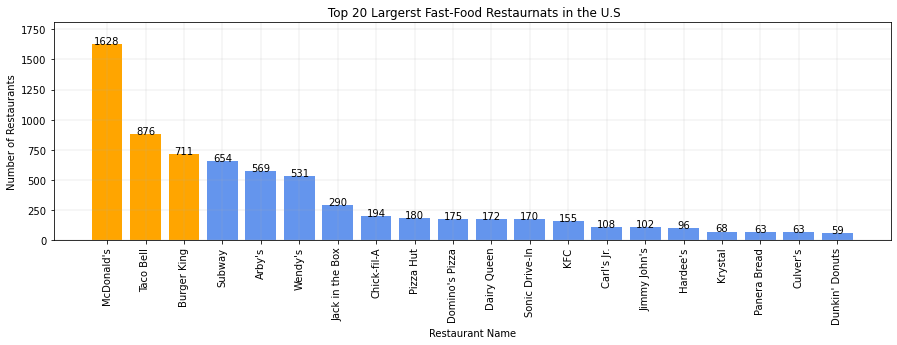

In [42]:
#%matplotlib notebook
y_axis =fastfood_US_counts["Count"]
        
mask1 = y_axis > 700
mask2 = y_axis <= 700
plt.figure(figsize=(15,4))
plt.grid(linestyle='-', linewidth=0.2)
plt.bar(x_axis[mask1], y_axis[mask1], color='orange', align="center")
plt.bar(x_axis[mask2], y_axis[mask2], color='cornflowerblue', align="center")
plt.xticks(tick_locations,fastfood_US_counts["Restaurant_Name"], rotation = "vertical")
plt.title(' Top 20 Largerst Fast-Food Restaurnats in the U.S')
plt.ylabel('Number of Restaurants')
plt.xlabel("Restaurant Name")
plt.ylim((0,1810))
plt.savefig("Top20_FastFood")

for i in range(len(x_axis)):
    plt.text(i,y_axis[i],y_axis[i],ha="center")
    
plt.show()

In [43]:
fastfood_US_counts.describe()

,Count
count,20.000000
mean,343.200000
std,391.729713
min,59.000000
25%,100.500000
50%,173.500000
75%,540.500000
max,1628.000000


In [44]:
fastfood_census = pd.read_csv("fastfood_census.csv")
fastfood_census

,name,country,latitude,longitude,Street Adress,province,state,region,division,price_level,rating,user_ratings_total
0,Sonic Drive-In,US,29.814697,-90.814742,"800 N Canal Blvd, Thibodaux, LA 70301",Thibodaux,LA,South,West South Central,1.0,4.3,479.0
1,Taco Bell,US,35.803788,-83.580553,"206 Wears Valley Rd, Pigeon Forge, TN 37863",Pigeon Forge,TN,South,East South Central,1.0,3.3,1029.0
2,Arby's,US,35.782339,-83.551408,"3652 Parkway, Pigeon Forge, TN 37863",Pigeon Forge,TN,South,East South Central,1.0,3.9,1620.0
3,Steak 'n Shake,US,33.562738,-84.321143,"2118 Mt Zion Parkway, Morrow, GA 30260",Morrow,GA,South,South Atlantic,1.0,3.4,5287.0
4,Wendy's,US,42.368823,-83.138251,"9768 Grand River Ave, Detroit, MI 48204",Detroit,MI,Midwest,East North Central,1.0,3.6,1560.0
5,Burger King,US,42.416819,-83.180444,"13600 W McNichols Rd, Detroit, MI 48235",Detroit,MI,Midwest,East North Central,1.0,3.1,831.0
6,Chipotle Mexican Grill,US,33.205722,-117.288645,"4111 Oceanside Blvd, Oceanside, CA 92056",Oceanside,CA,West,Pacific,1.0,3.9,249.0
7,Dairy Queen,US,32.366020,-96.103364,"208 W Mason St, Mabank, TX 75147",Mabank,TX,South,West South Central,1.0,3.8,404.0
8,Dairy Queen,US,29.570079,-95.568166,"5801 Highway 6, Missouri City, TX 77459",Missouri City,TX,South,West South Central,2.0,4.0,586.0
9,Carl's Jr.,US,34.133291,-117.924566,"1190 W Foothill Blvd, Azusa, CA 91702",Azusa,CA,West,Pacific,1.0,3.6,381.0


In [45]:
fastfood_census["Density"] = [1]*len(fastfood_census)
fastfood_census

,name,country,latitude,longitude,Street Adress,province,state,region,division,price_level,rating,user_ratings_total,Density
0,Sonic Drive-In,US,29.814697,-90.814742,"800 N Canal Blvd, Thibodaux, LA 70301",Thibodaux,LA,South,West South Central,1.0,4.3,479.0,1
1,Taco Bell,US,35.803788,-83.580553,"206 Wears Valley Rd, Pigeon Forge, TN 37863",Pigeon Forge,TN,South,East South Central,1.0,3.3,1029.0,1
2,Arby's,US,35.782339,-83.551408,"3652 Parkway, Pigeon Forge, TN 37863",Pigeon Forge,TN,South,East South Central,1.0,3.9,1620.0,1
3,Steak 'n Shake,US,33.562738,-84.321143,"2118 Mt Zion Parkway, Morrow, GA 30260",Morrow,GA,South,South Atlantic,1.0,3.4,5287.0,1
4,Wendy's,US,42.368823,-83.138251,"9768 Grand River Ave, Detroit, MI 48204",Detroit,MI,Midwest,East North Central,1.0,3.6,1560.0,1
5,Burger King,US,42.416819,-83.180444,"13600 W McNichols Rd, Detroit, MI 48235",Detroit,MI,Midwest,East North Central,1.0,3.1,831.0,1
6,Chipotle Mexican Grill,US,33.205722,-117.288645,"4111 Oceanside Blvd, Oceanside, CA 92056",Oceanside,CA,West,Pacific,1.0,3.9,249.0,1
7,Dairy Queen,US,32.366020,-96.103364,"208 W Mason St, Mabank, TX 75147",Mabank,TX,South,West South Central,1.0,3.8,404.0,1
8,Dairy Queen,US,29.570079,-95.568166,"5801 Highway 6, Missouri City, TX 77459",Missouri City,TX,South,West South Central,2.0,4.0,586.0,1
9,Carl's Jr.,US,34.133291,-117.924566,"1190 W Foothill Blvd, Azusa, CA 91702",Azusa,CA,West,Pacific,1.0,3.6,381.0,1


In [46]:
#fastfood_census["fillcolor"] = fastfood_census["name"].apply(lambda name: "green" if name == "McDonald's" else "blue"  )
#fastfood_census

In [47]:
import plotly.express as px

state_codes = fastfood_census['state'].value_counts().index.tolist()
value_counts_by_states = fastfood_census['province'].value_counts()


import plotly.express as px
fig = px.density_mapbox(fastfood_census, lat='latitude', lon='longitude', z='Density', radius=10,
                        center=dict(lat=38, lon=-98), zoom=3.1,
                        mapbox_style="stamen-terrain")
fig.show()
#density 
#40.011148, -99.529180

In [48]:
state_codes = fastfood_census['state'].value_counts().index.tolist()
value_counts_by_states = fastfood_census['province'].value_counts()


import plotly.express as px
fig = px.density_mapbox(fastfood_census, lat='latitude', lon='longitude', z='Density', radius=10,
                        center=dict(lat=35.2, lon=-87), zoom=5.8,
                        mapbox_style="stamen-terrain")
fig.show()
#density 
#40.011148, -99.529180

In [ ]:
#mick = fastfood_census[fastfood_census['name'] == "McDonald's"]
#mick.head()

In [ ]:
fig = go.Figure(data=go.Scattergeo(
       lon = fastfood_census['longitude'],
        lat = fastfood_census['latitude'],
        text = fastfood_census["name"],
        mode = 'markers',
        fillcolor = "Red"
        
        ))
fig = go.Figure(data=markerlayer)

fig.update_layout(
        title = 'U.S Fast Food Resturants',
        geo_scope='usa',
    )
fig.show()

In [ ]:
#d1=fastfood_census.groupby(['region','state']).agg({'name':'count'})
#d1

In [ ]:
ch_restaurant_df.groupby(['name','province'])['User_Rating_Total'].sum()